# Analysis of SIT and Sentinel - 2 level 1C Top of Atmosphere (TOA) reflectances 

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import rasterio
from glob import glob
import os
from collections import defaultdict
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import rasterio.warp as warp
from rasterio.transform import Affine
from rasterio.merge import merge
import rasterio.mask
from rasterio.enums import Resampling
from affine import Affine
from pyproj import Proj, transform
import shapely.wkt
from shapely.geometry import mapping
import dateparser
import cv2
import numpy as np
from geojson import Polygon, FeatureCollection, GeometryCollection, Feature, dump
from datetime import timedelta
from sentinelhub import WmsRequest, AwsProductRequest, BBox, CRS, MimeType, CustomUrlParam, get_area_dates, geo_utils
import warnings
from s2cloudless import S2PixelCloudDetector, CloudMaskRequest
from sentinelsat import SentinelAPI, geojson_to_wkt
warnings.filterwarnings("ignore")

def overlay_cloud_mask(image, ax, mask=None):
    """
    Utility function for plotting RGB images with binary mask overlayed.
    """
    print(image.shape)
    ax.imshow(image.transpose(1,2,0))
    if mask is not None:
        cloud_image = np.zeros((mask.shape[0], mask.shape[1], 4), dtype=np.uint8)
        cloud_image[mask == 1] = np.asarray([0, 255, 255, 100], dtype=np.uint8)
        ax.imshow(cloud_image)
        
navgemGray = glob(os.path.join(r'.\sentinel4thinice_navgem_500', 'navgem','500','*color_500.tif'))
ncepGray = glob(os.path.join(r'.\sentinel4thinice_ncep_500', 'ncep','500','*color_500.tif'))

c:\users\oyste\miniconda3\envs\rasterpy\lib\importlib\_bootstrap.py:205: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
c:\users\oyste\miniconda3\envs\rasterpy\lib\site-packages\dateparser\utils\strptime.py:26: ResourceWarning: unclosed file <_io.TextIOWrapper name='c:\\users\\oyste\\miniconda3\\envs\\rasterpy\\lib\\_strptime.py' mode='r' encoding='utf-8'>
  'strptime_patched', *imp.find_module('_strptime')
c:\users\oyste\miniconda3\envs\rasterpy\lib\importlib\_bootstrap.py:205: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
c:\users\oyste\miniconda3\envs\rasterpy\lib\importlib\_bootstrap.py:205: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
c:\users\oyste\miniconda3\envs\rasterpy\lib\importlib\_bootstrap.py:205: ImportWarning: can't res

# Cloud Detection
##### Creating cloud masks for each merged S-2 product

In [2]:
S2_overlapped = glob(os.path.join(r'E:\MastersProjectData\SIT_S2','*slstr*'))
S2cloudless_bands = [0, 1, 3, 4, 7, 8, 9, 10, 11, 12]
masks = {}
dates = []
for S2 in S2_overlapped:
    if len(os.listdir(S2))==0:
        continue
    SITname = os.path.basename(S2)+'.tif'
    for SIT_ in navgemGray:
        name = os.path.basename(SIT_)
        if SITname == name:
            SIT = SIT_
        else:
            continue
    S2_merged = os.path.join(S2, 'Merged_S1C', 'merged.tif')
    dates.append(os.path.basename(SIT)[:22])
    
    with rasterio.open(S2_merged) as src:
        data = src.read()
    
    # Preparing for cloudmask calculation
    data = np.expand_dims(data[S2cloudless_bands], axis=0).transpose(0, 2, 3, 1)
    
    masks[os.path.basename(SIT)[:22]] = S2PixelCloudDetector(threshold=0.3, dilation_size=3).get_cloud_masks(data)
    
    

In [3]:
del data

# SIT Pixels extraction
##### Finding the valid Sentinel - 2 pixels and the extractring the SIT information with the corresponding S2 band reflectances

In [4]:
thin_ice_S2 = []
thick_ice_S2 = []
thin_SIT_vals=[]
SIT_image = []
S2_image = []
i = 0
for S2 in S2_overlapped:
    if len(os.listdir(S2))==0:
        continue
    SITname = os.path.basename(S2)+'.tif'
    for SIT_ in navgemGray:
        name = os.path.basename(SIT_)
        if SITname == name:
            SIT = SIT_
        else:
            continue
    S2_merged = os.path.join(S2, 'Merged_S1C', 'merged.tif')
    date = os.path.basename(SIT)[:22]
    with rasterio.open(SIT) as SITraster:
        thin_ice= SITraster.read(1)
        with rasterio.open(S2_merged) as S2raster:
            data_set = S2raster.read()
            S2_image.append(data_set.transpose(1,2,0))
            valid_pixels = (data_set[1] > 0.0) & (masks[date][0] != 1)
            valid_thin_ice = thin_ice[valid_pixels]
            thick_ice = valid_thin_ice == 90
            valid_S2 = data_set[:, valid_pixels]
            thin_ice_index = (valid_thin_ice > 100) & (valid_thin_ice <= 130)
            thin_ice_vals = valid_thin_ice[thin_ice_index] - 100
            thin_ice_S2_valid = valid_S2[:, thin_ice_index].transpose(1,0)
            thick_ice_S2_valid = valid_S2[:, thick_ice].transpose(1,0)
    
    thin_ice_S2.append(thin_ice_S2_valid)
    thick_ice_S2.append(thick_ice_S2_valid)
    thin_SIT_vals.append(thin_ice_vals)
    SIT_image.append(thin_ice)
    

In [5]:
S2_sit_array = np.concatenate(thin_ice_S2)
S2_thickit_array = np.concatenate(thick_ice_S2)
thin_SIT_vals_arr = np.concatenate(thin_SIT_vals)

Text(0.5, 1.0, 'Overview of SIT TOA spectras for each thickness')

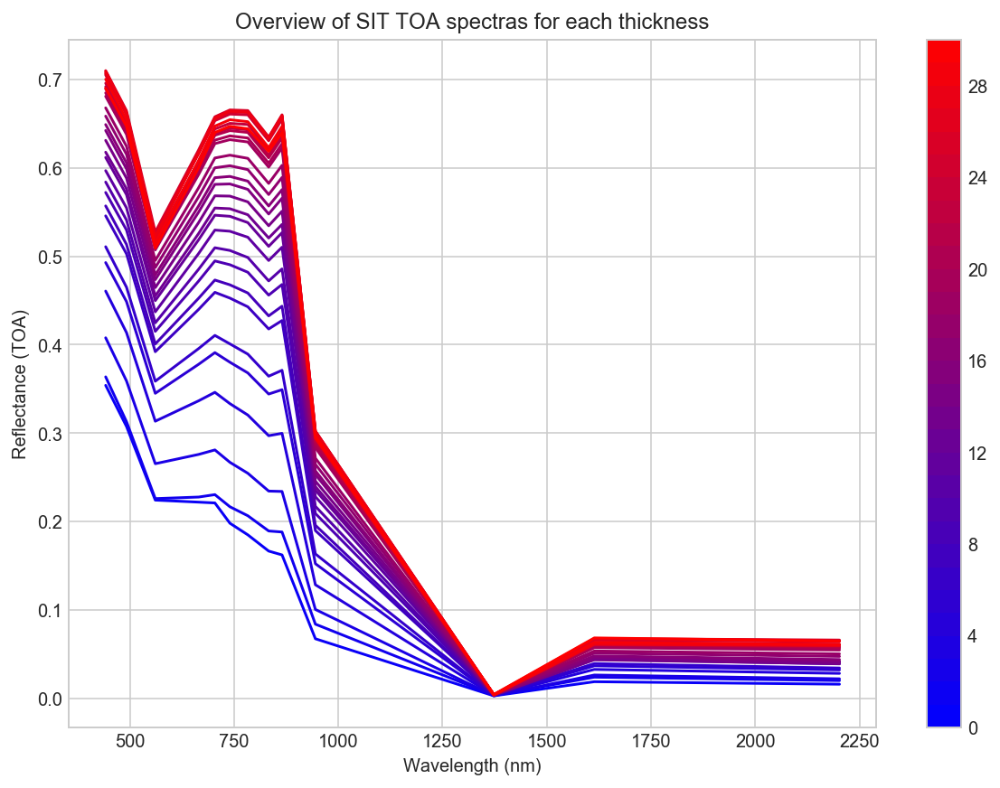

In [6]:
import matplotlib as mpl
plt.figure(figsize=(10, 7))
min_, max_ = (0, 30)
step = 1

# Setting up a colormap that's a simple transtion
mymap = mpl.colors.LinearSegmentedColormap.from_list('mycolors',['blue','red'])

# Using contourf to provide my colorbar info, then clearing the figure
Z = [[0,0],[0,0]]
levels = range(min_,max_+step,step)
CS3 = plt.contourf(Z, levels, cmap=mymap)
plt.clf()

plt.style.use('seaborn-whitegrid')
thin_ice_vals_iter, counts = np.unique(thin_SIT_vals_arr, return_counts=True)

lambda_bands1C = [442, 492, 561, 665, 704, 740, 783, 833, 865, 945, 1373, 1614, 2202]
lambda_bands2A = [442, 492, 561, 665, 704, 740, 783, 865, 945, 1614, 2202]
cmap = plt.get_cmap('jet_r')
N = 20
for i, cmval in enumerate(thin_ice_vals_iter):
    r = (float(cmval)-min_)/(max_-min_)
    g = 0
    b = 1-r
    thin_ice_cm = thin_SIT_vals_arr == cmval
    thin_ice_S2_cm = np.mean(S2_sit_array[thin_ice_cm,:], axis=0)
    plt.plot(lambda_bands1C, thin_ice_S2_cm, c=(r, g, b), label='{} cm'.format(cmval))

    #plt.title('Spectra for {} cm thick ice'.format(cmval))
#plt.plot(lambda_bands, thick_ice_S2.mean(axis=0),'m--', label='Thick_Ice', linewidth=3)
#plt.legend()
plt.colorbar(CS3)

plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance (TOA)')
plt.title("Overview of SIT TOA spectras for each thickness")


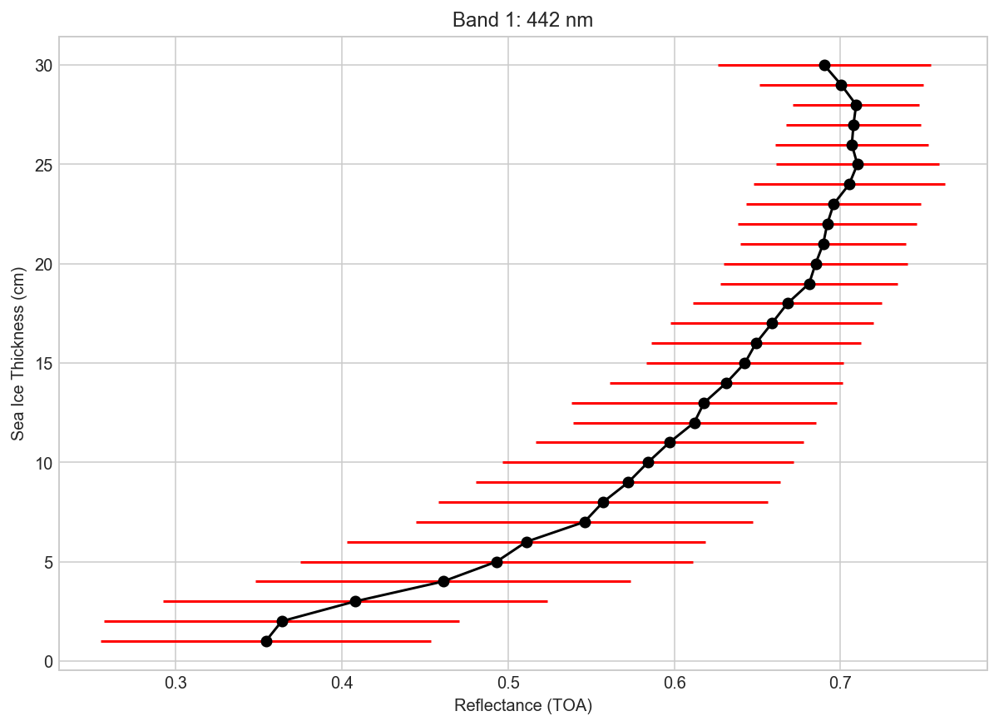

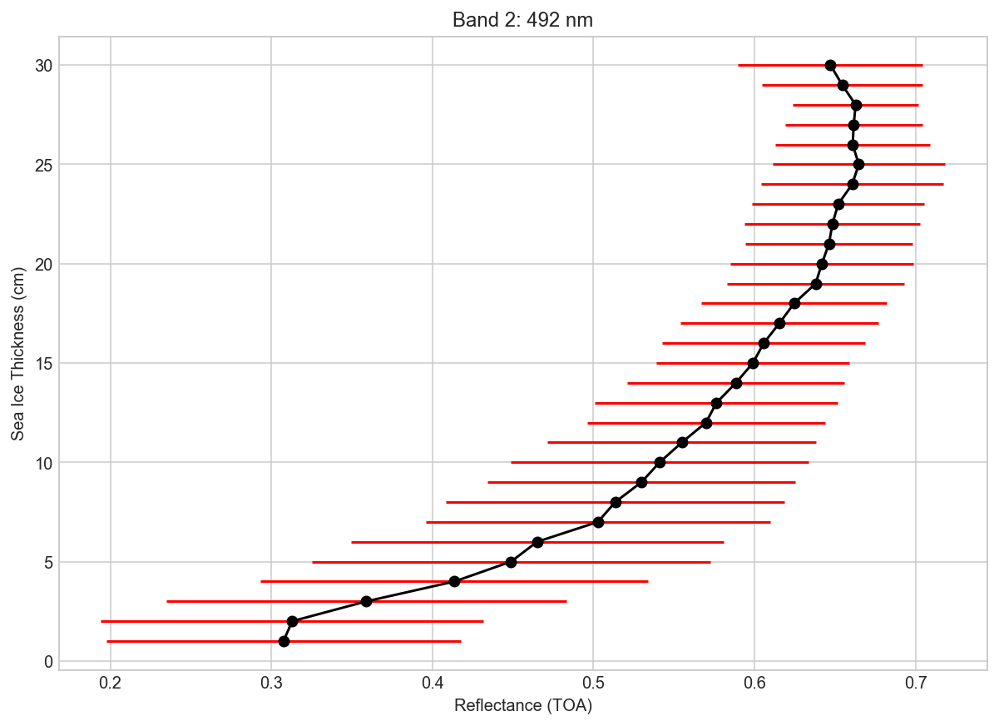

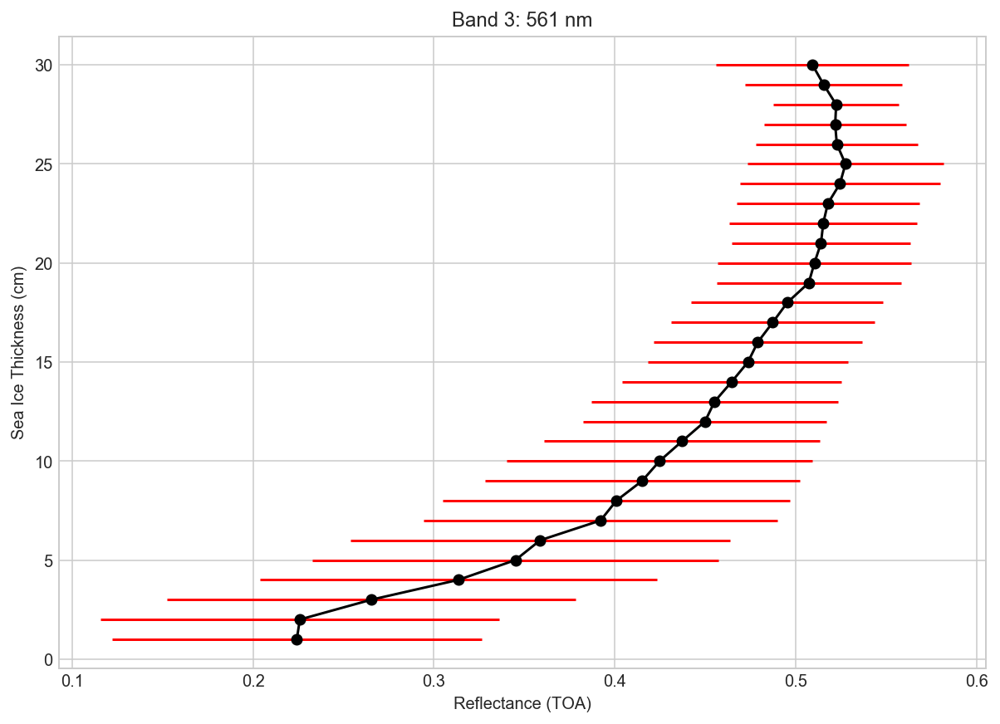

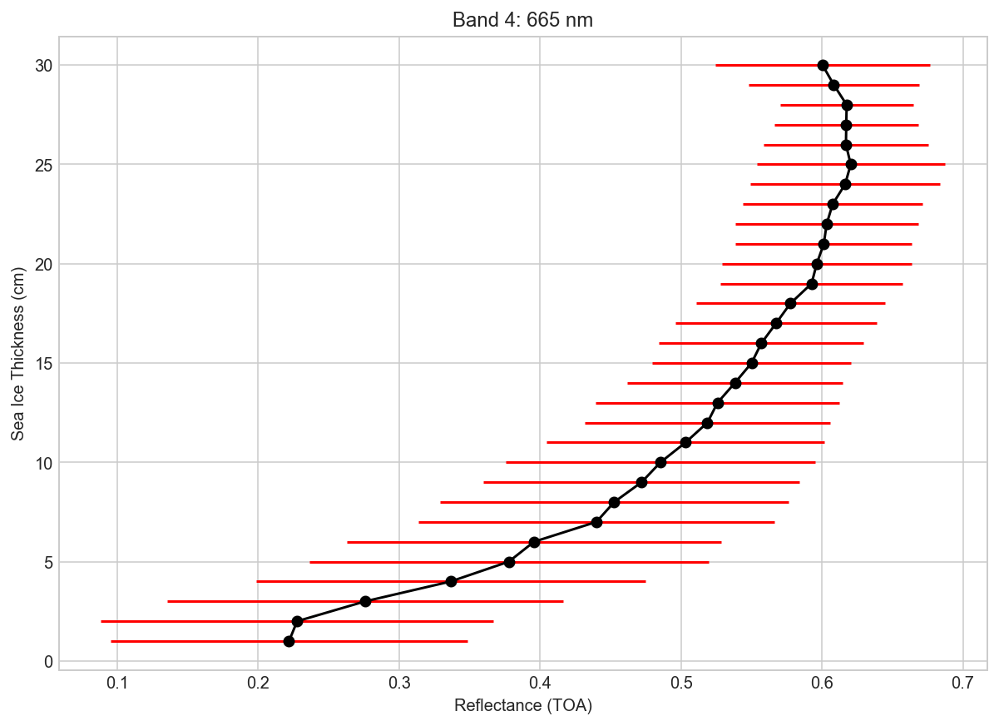

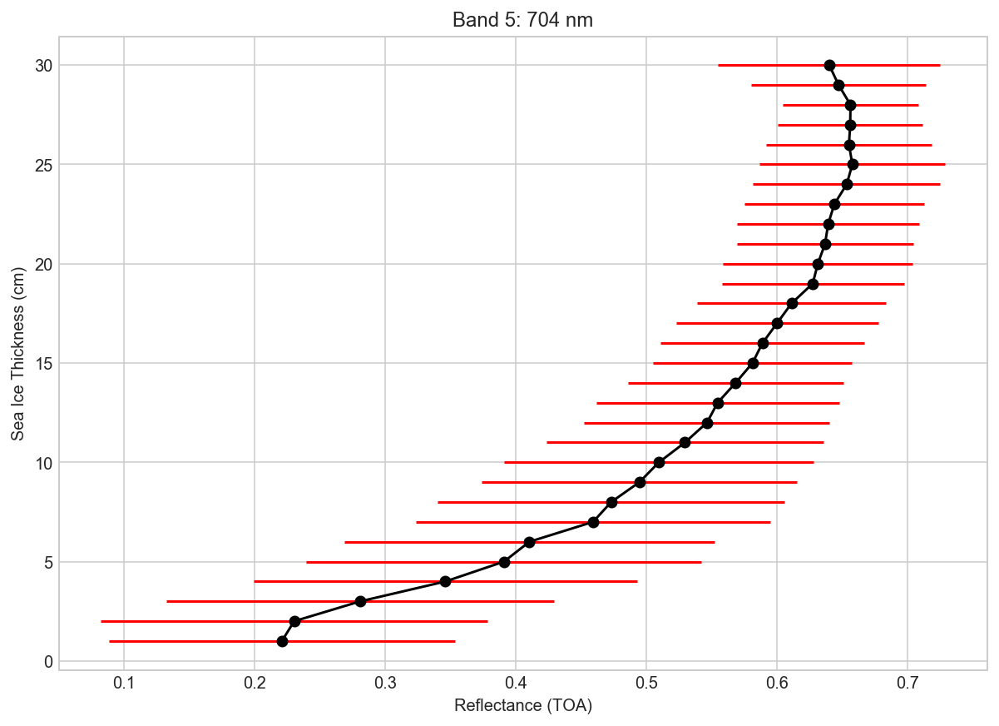

...

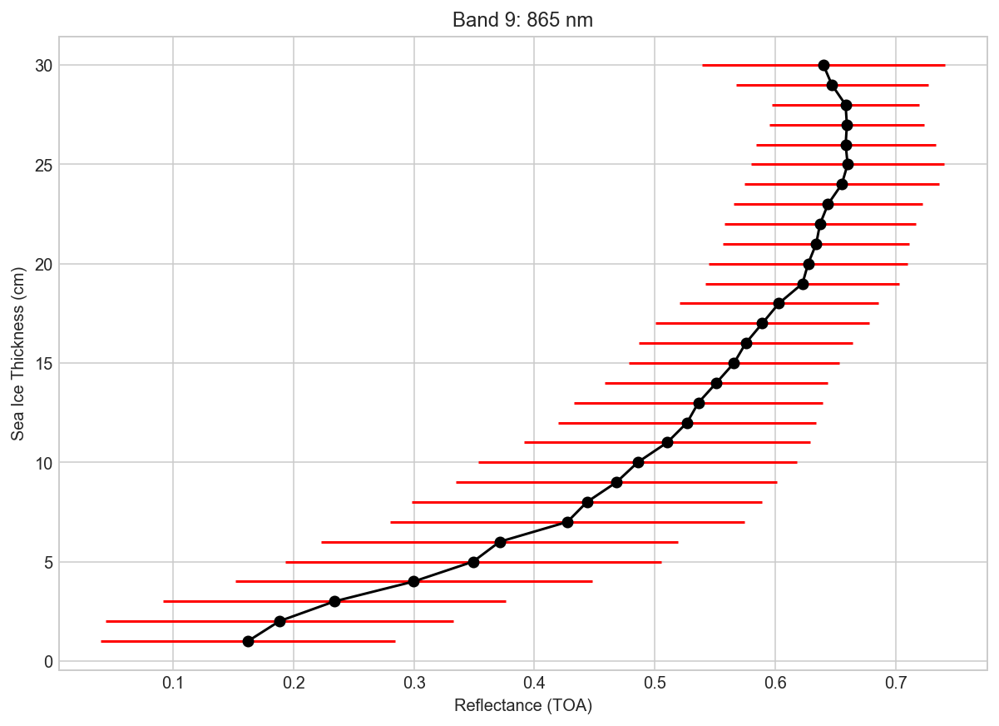

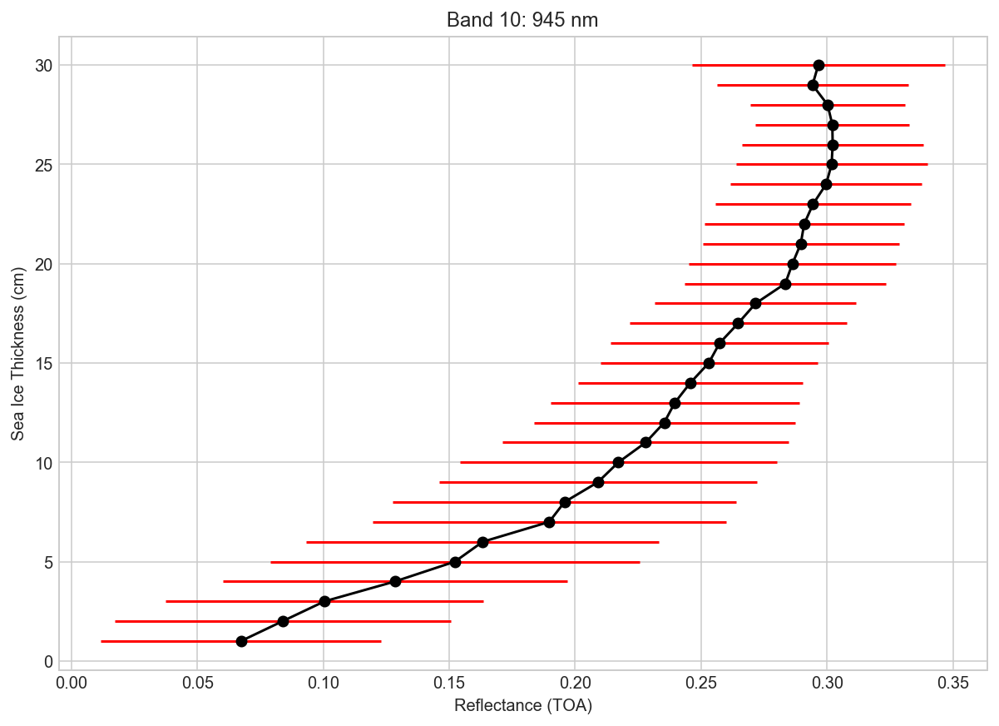

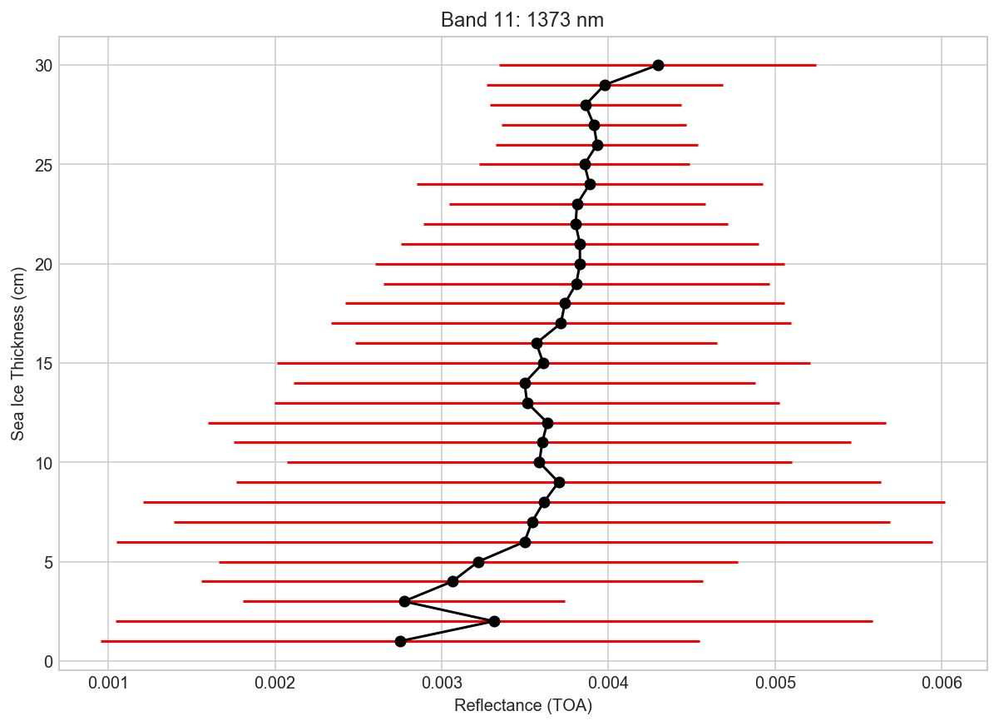

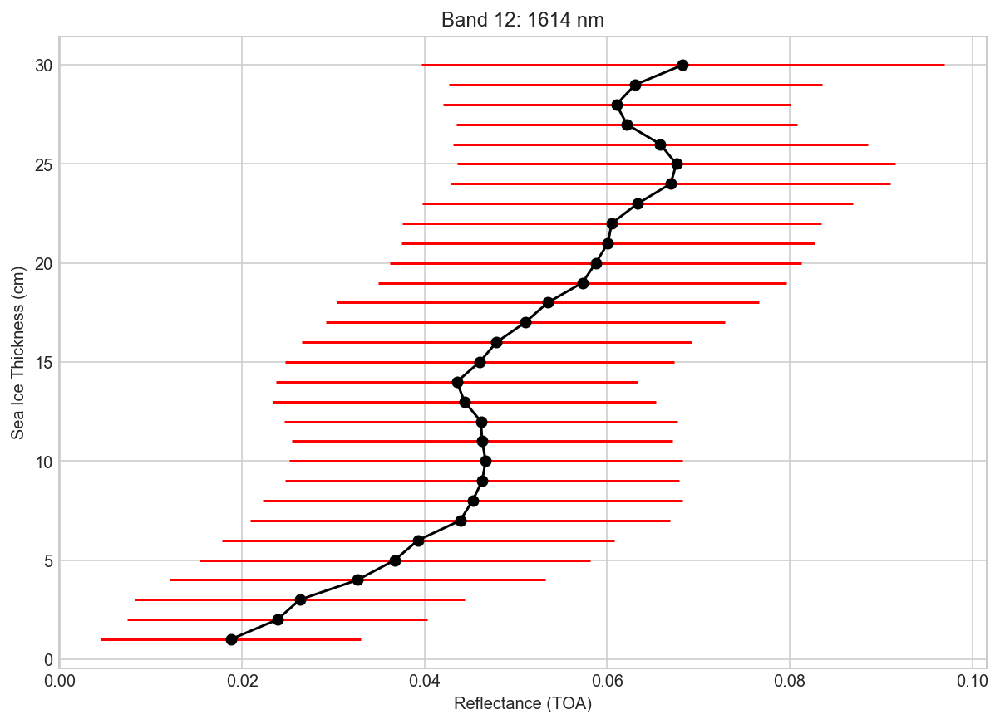

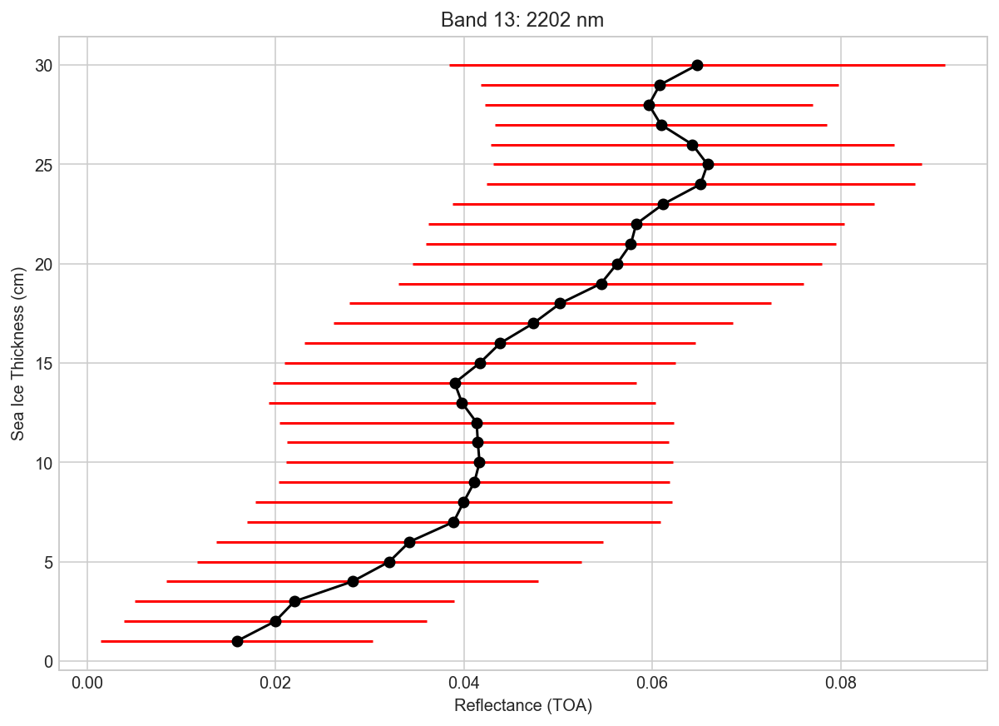

In [7]:
#fig = plt.figure(figsize=(10, 7))
#ax = fig.add_subplot(111)
cmap = plt.get_cmap('jet_r')
thin_ice_vals_iter, counts = np.unique(thin_SIT_vals_arr, return_counts=True)
mean_vals = []
sigma = []
N=20
for i, band in enumerate(range(13)):
    standard_var_band = []
    mean_band = []
    color = cmap(float(i)/N)
    for j, cmval in enumerate(thin_ice_vals_iter):
        thin_ice_cm = thin_SIT_vals_arr == cmval
        mean_band.append(np.mean(S2_sit_array[thin_ice_cm, band]))
        standard_var_band.append(np.std(S2_sit_array[thin_ice_cm, band]))
    #mean_band.append(np.mean(thick_ice_S2_valid[:, band]))
    sigma.append(standard_var_band)
    mean_vals.append(mean_band)
    #standard_var_band.append(np.std(S2_thickit_array[:, band]))
    #ax.plot(mean_band,np.append(thin_ice_vals_iter, 40), c=color, label='Band {}: {} nm'.format(i+1, lambda_bands[i]))
    plt.figure(figsize=(10, 7))
    plt.errorbar(mean_band,thin_ice_vals_iter, xerr=standard_var_band, fmt='-ok', ecolor='r')
    plt.title('Band {}: {} nm'.format(i+1, lambda_bands1C[i]))
    plt.ylabel('Sea Ice Thickness (cm)')
    plt.xlabel('Reflectance (TOA)')

#ax.set_xlabel('Reflectance')
#ax.legend()
#ax.set_ylabel('Sea Ice Thickness (cm)')
#ax.set_xlabel('Reflectance')

In [59]:

"""
1. divide sigma_t/mean_t = sigma_t_norm
2. mean()
"""

'\n1. divide sigma_t/mean_t = sigma_t_norm\n2. mean()\n'

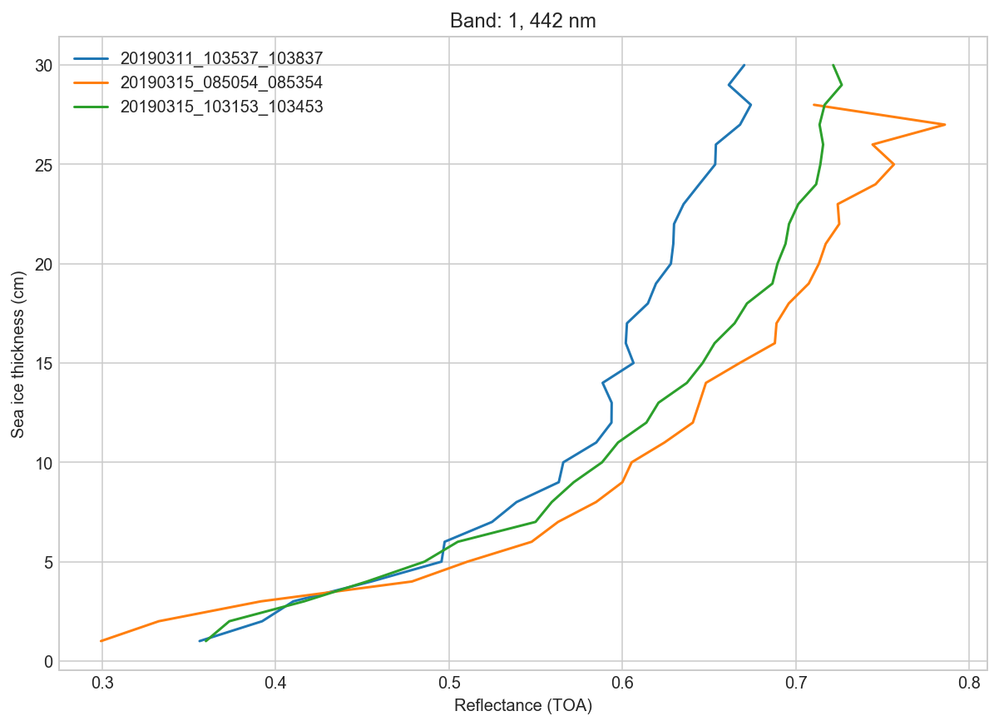

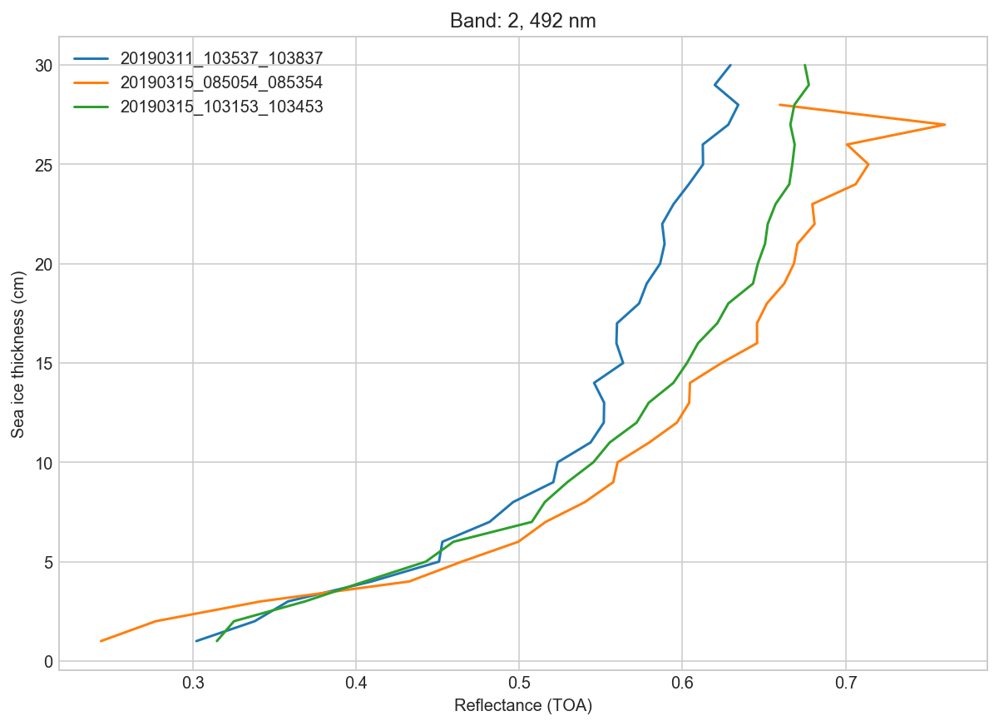

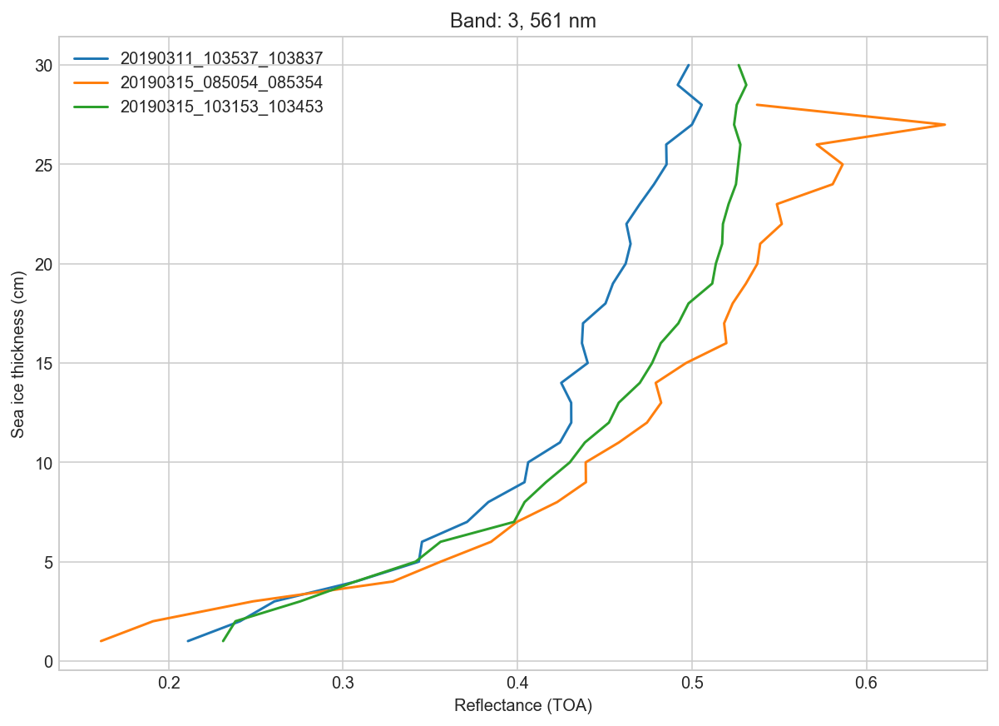

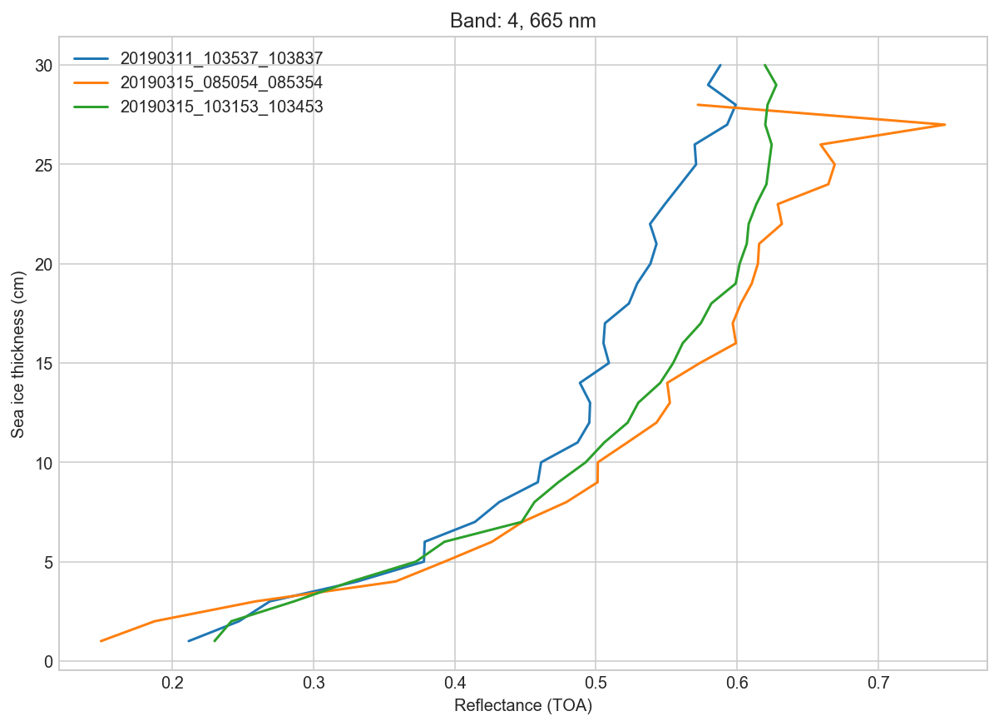

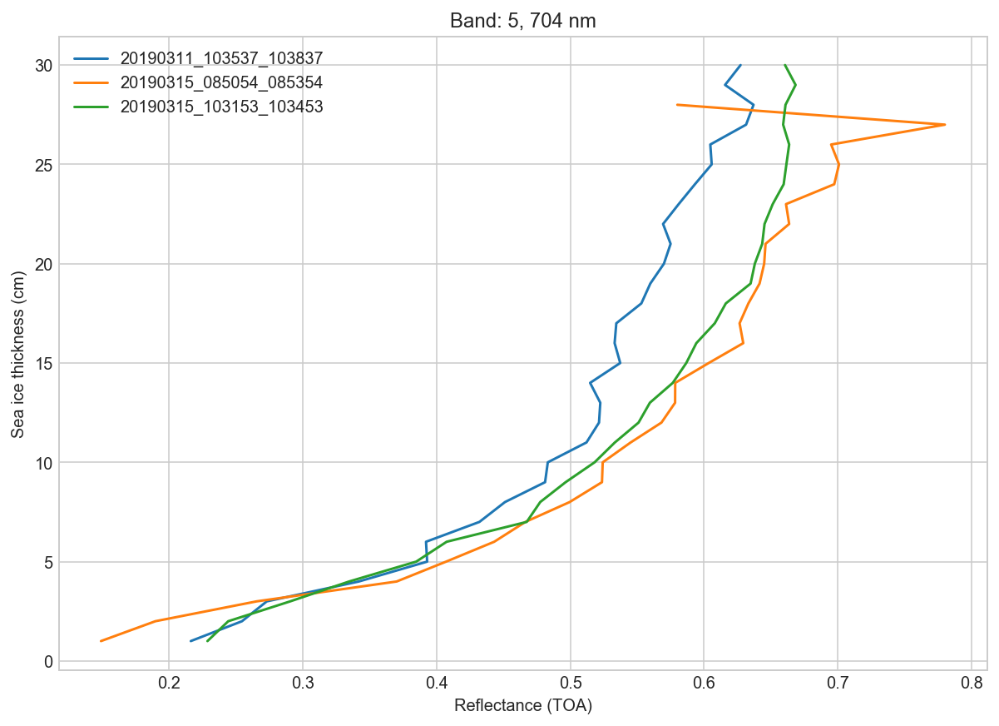

...

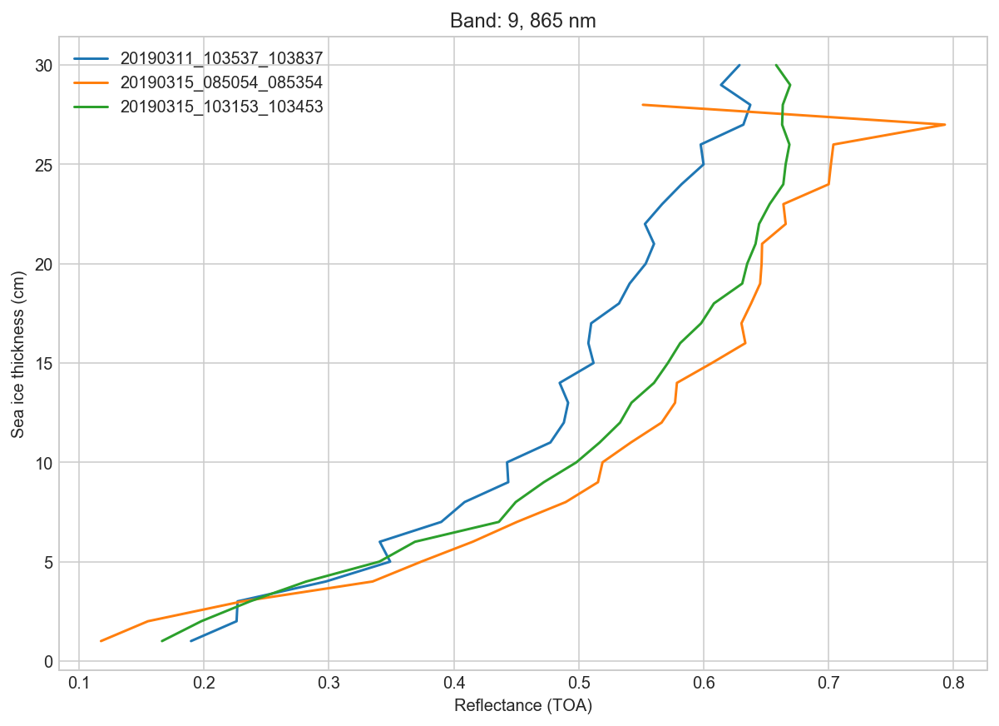

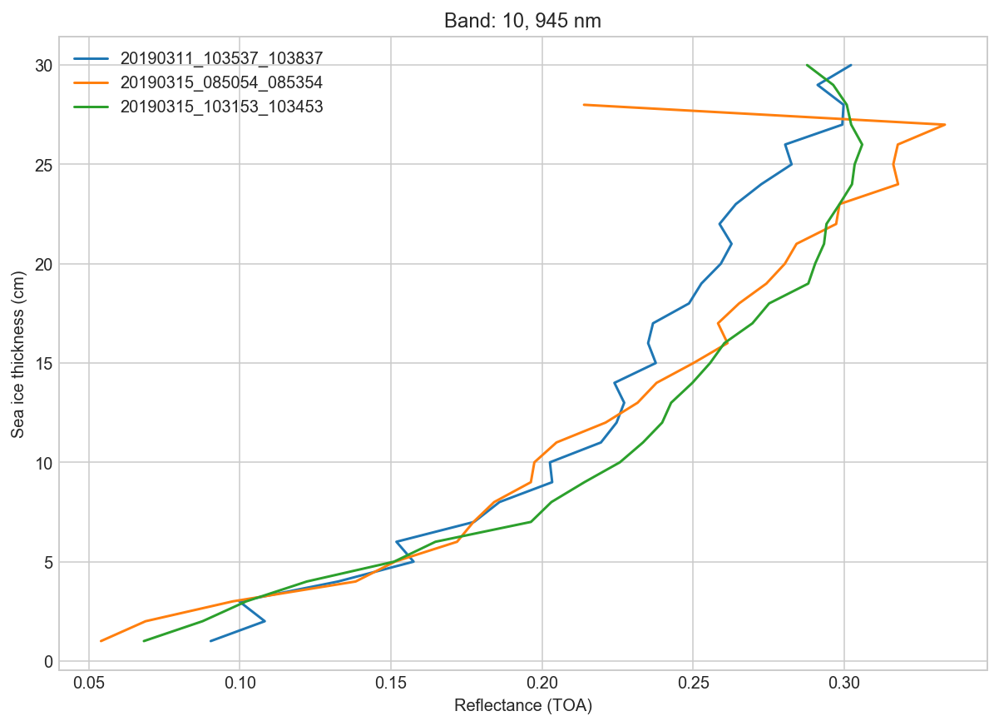

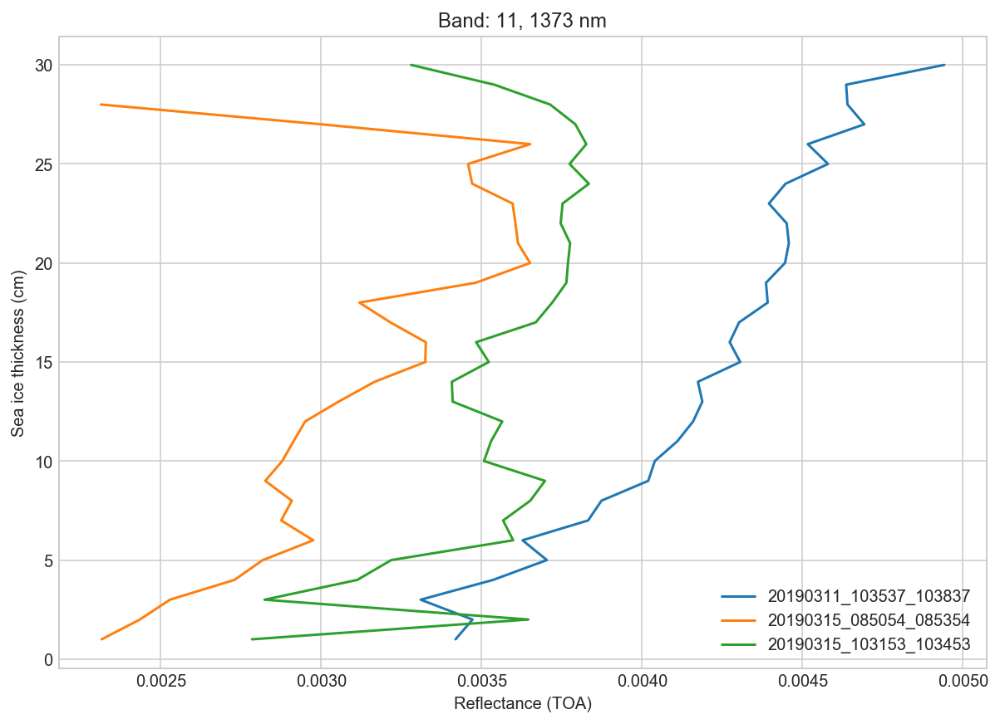

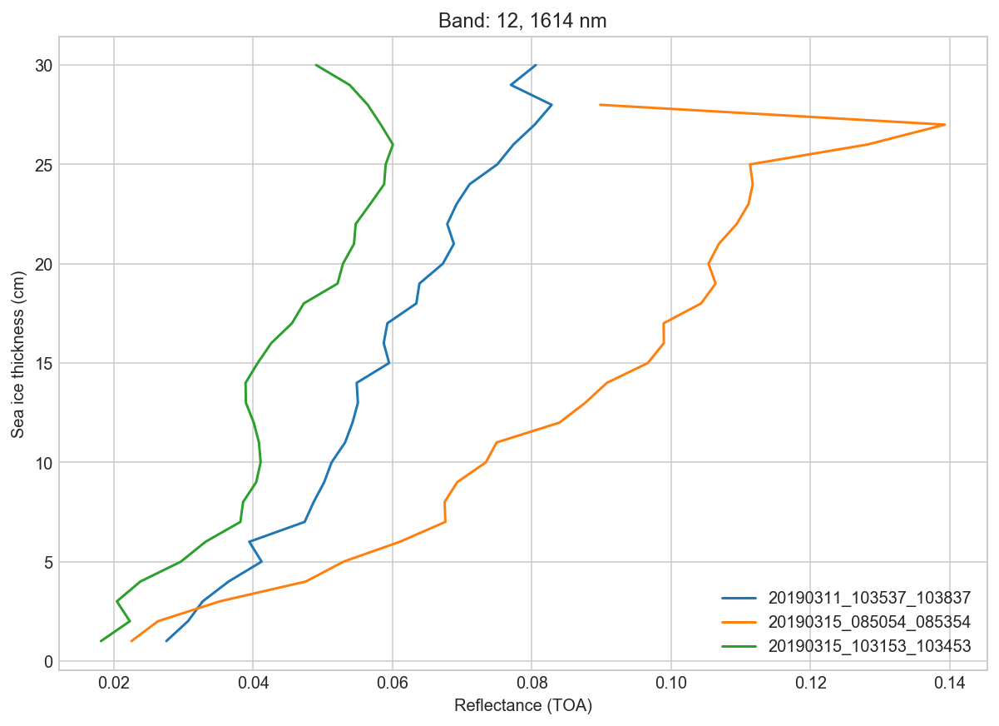

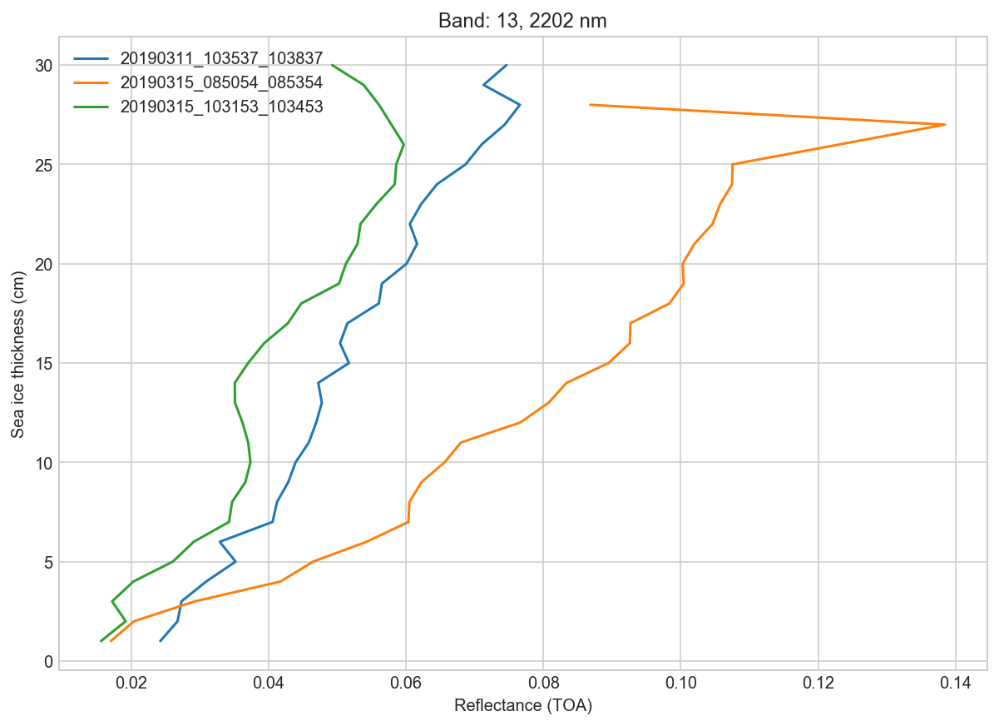

In [8]:
thin_ice_vals_iter, counts = np.unique(thin_SIT_vals[0], return_counts=True)
lambda_bands = [442, 492, 561, 665, 704, 740, 783, 833, 865, 945, 1373, 1614, 2202]
for i, band in enumerate(range(13)):
    plt.figure(figsize=(10, 7))
    plt.xlabel('Reflectance (TOA)')
    plt.ylabel('Sea ice thickness (cm)')
    for SITS2, vals, time in zip(thin_ice_S2, thin_SIT_vals, dates):
        mean_band = []
        standard_var_band = []
        for j, cmval in enumerate(thin_ice_vals_iter):
            thin_ice_cm = vals == cmval
            mean_band.append(np.mean(SITS2[thin_ice_cm, band]))
        plt.plot(mean_band,thin_ice_vals_iter, label=time)
        plt.title('Band: {}, {} nm'.format(i+1, lambda_bands1C[i]))
    plt.grid(True)
    plt.legend()
    
    

In [15]:
import scipy.optimize as optim
from sklearn.preprocessing import normalize

In [6]:
# Summing up the spectras the gives the best correlation between SIT and reflectanca (BOA)
valid_bands = [0,1,2,3,4,5,6,7,8,9,11,12]
x_data_sum = np.sum(S2_sit_array[:, :9], axis=1)/9
y_data = thin_SIT_vals_arr
x_data = S2_sit_array[:, valid_bands]
thin_ice_vals_iter, counts = np.unique(thin_SIT_vals_arr, return_counts=True)

array([[0.549295  , 0.5026128 , 0.38172847, ..., 0.46956477, 0.44041765,
        0.45657882],
       [0.67104155, 0.63600904, 0.4928156 , ..., 0.64543664, 0.6225077 ,
        0.64463264],
       [0.6812146 , 0.6341456 , 0.48986074, ..., 0.63994557, 0.6139181 ,
        0.63721126],
       ...,
       [0.23583   , 0.17684095, 0.10669416, ..., 0.06001912, 0.05039773,
        0.04791569],
       [0.22349167, 0.16446988, 0.09566296, ..., 0.04783309, 0.0404074 ,
        0.0371625 ],
       [0.22819583, 0.17088127, 0.10143955, ..., 0.05284387, 0.04584322,
        0.04181691]], dtype=float32)

In [48]:
def reject_outlierIQR(x_data, y_data):
    
    data_collect = []
    
    green_diamond = dict(markerfacecolor='r', marker='D',markeredgewidth=0.0,fillstyle='full', markersize=2)
    for i, cmval in enumerate(thin_ice_vals_iter):
        thin_ice_cm = y_data == cmval
        data_collect.append(x_data[thin_ice_cm])
    plt.figure(figsize=(10,7))
    r = plt.boxplot(data_collect, vert=False, flierprops=green_diamond)
    plt.show()
    
    no_outlier = []
    no_out_sit = []
    for i, data_ in enumerate(r['fliers']):
        (out, sit) = data_.get_data()
        no_out = [x for x in data_collect[i] if x not in out]
        no_out_sit.append(np.ones((len(data_collect[i])-len(sit)))*(i+1))
        no_outlier.append(np.asarray(no_out))
    return no_outlier, no_out_sit


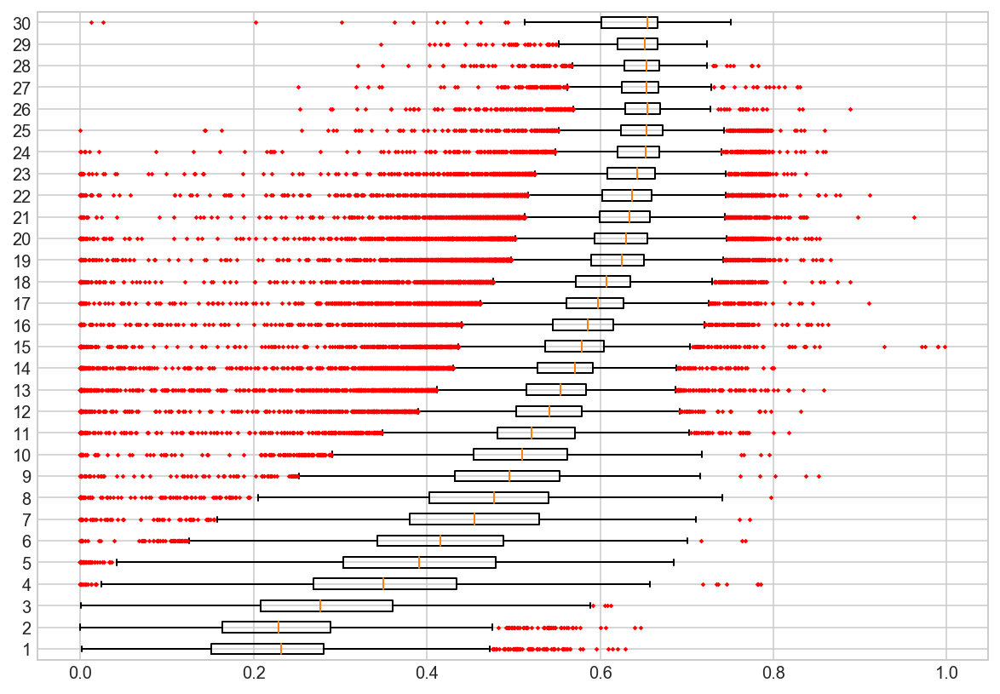

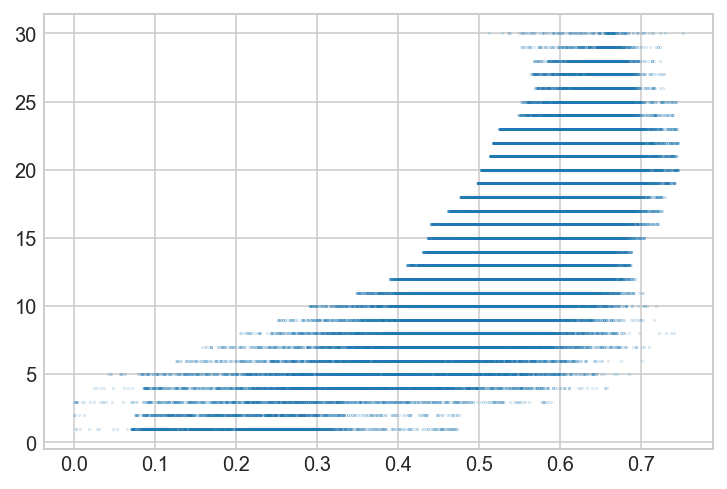

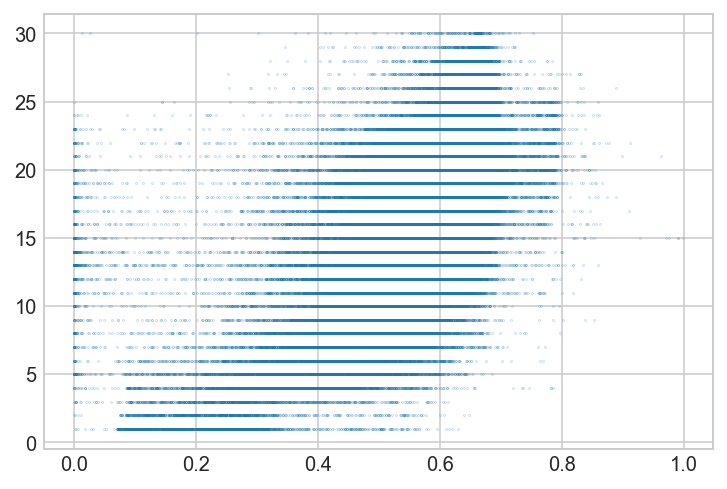

In [18]:
no_out_x, no_out_y = reject_outlierIQR(x_data, y_data)

mean_x = []
std_x = []
for cm_x in no_out_x:
    mean_x.append(np.mean(cm_x))
    std_x.append(np.std(cm_x))
x_arr, y_arr = np.concatenate(no_out_x), np.concatenate(no_out_y)
rand_idx = np.random.permutation(len(x_arr))
x_arr = x_arr[rand_idx]
y_arr = y_arr[rand_idx]

plt.figure()
plt.scatter(x_arr, y_arr, s=0.01)
plt.figure()
plt.scatter(x_data, y_data, s=0.01)

(1911, 9)
(1801, 9)
(949, 9)
(884, 9)
(955, 9)
(907, 9)
(2045, 9)
(1954, 9)
(2420, 9)
(2312, 9)
(2085, 9)
(1983, 9)
(2434, 9)
(2327, 9)
(2710, 9)
(2603, 9)
(2753, 9)
(2647, 9)
(3366, 9)
(3219, 9)
(4949, 9)
(4751, 9)
(7362, 9)
(7105, 9)
(9726, 9)
(9348, 9)
(10458, 9)
(10089, 9)
(10535, 9)
(10165, 9)
(12352, 9)
(11891, 9)
(12350, 9)
(11848, 9)
(12580, 9)
(12106, 9)
(18074, 9)
(17330, 9)
(15997, 9)
(15311, 9)
(13484, 9)
(12906, 9)
(11468, 9)
(10967, 9)
(7037, 9)
(6754, 9)
(2790, 9)
(2654, 9)
(2288, 9)
(2154, 9)
(1763, 9)
(1666, 9)
(1357, 9)
(1284, 9)
(1144, 9)
(1089, 9)
(437, 9)
(410, 9)
(205, 9)
(197, 9)


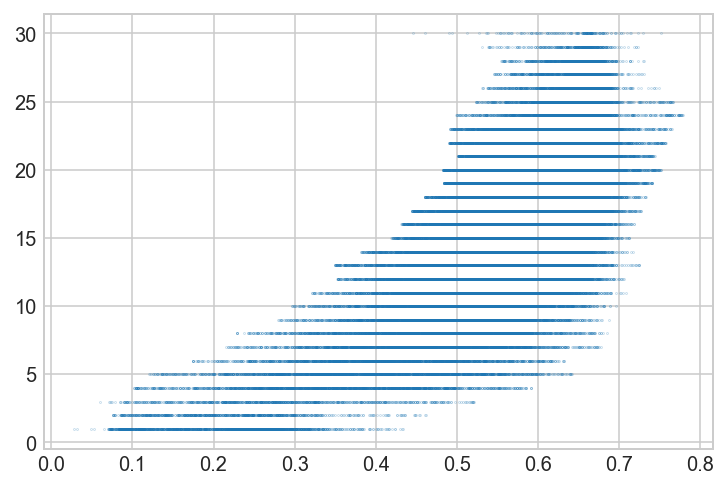

In [65]:
def reject_outliersSTD(data, m=2):
    outliers_idx = (abs(data - np.mean(data, axis=0)) < m * np.std(data, axis=0))
    return data[outliers_idx], outliers_idx
mean_x=[]
std_x =[]
x_list=[]
y_list=[]
std_list=[]
x_list_ = []
for j, cmval in enumerate(thin_ice_vals_iter):
    thin_ice_cm = y_data == cmval
    y_cm = y_data[thin_ice_cm]
    x_data_cm = x_data[thin_ice_cm,...]
    print(x_data_cm.shape)
    x_data_ro, idx_ro = reject_outliersSTD(x_data_sum[thin_ice_cm], m=2)
    print(x_data_cm[idx_ro,...].shape)
    x_list.append(x_data_ro)
    x_list_.append(x_data_cm[idx_ro,...])
    y_list.append(y_cm[idx_ro])
    std_list.append(np.ones(x_data_ro.shape)*np.std(x_data_ro))
    mean_x.append(np.mean(x_data_ro))
    std_x.append(np.std(x_data_ro))

x_arr = np.concatenate(x_list)
y_arr = np.concatenate(y_list)
std_arr = np.concatenate(std_list)
rand_idx = np.random.permutation(len(x_arr))
x_arr = x_arr[rand_idx]
y_arr = y_arr[rand_idx]
std_arr = std_arr[rand_idx]
plt.figure()
plt.scatter(x_arr, y_arr, s=0.01)

Text(0, 0.5, 'Thin SIT (cm)')

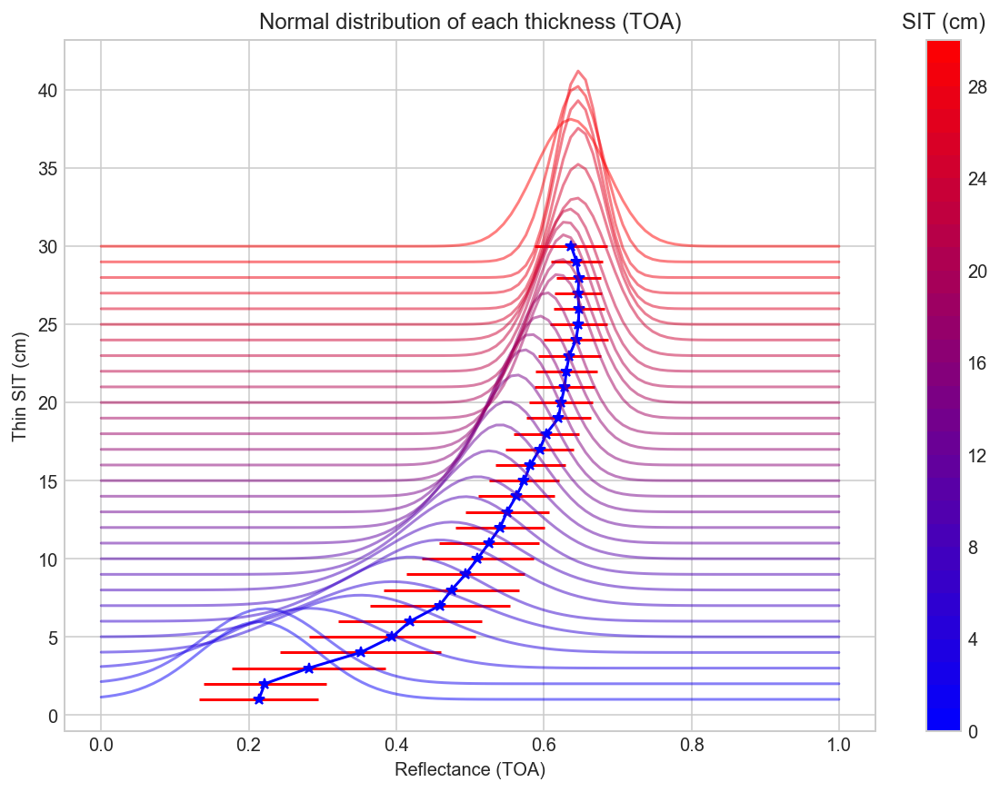

In [21]:
import scipy.stats as stats

plt.figure(figsize=(10, 7))
plt.errorbar(mean_x, thin_ice_vals_iter,fmt='none', xerr=std_x, ecolor='r')
plt.plot(mean_x, thin_ice_vals_iter, 'b*-')
norm_dist = []
x = np.linspace(0, 1.0, 100)
for (i, mean), std, z in zip(enumerate(mean_x), std_x, thin_ice_vals_iter):
    r = (float(z)-min_)/(max_-min_)
    g = 0
    b = 1-r
    #x = np.linspace(mean - 3*std, mean + 3*std, 100)
    p = stats.norm.pdf(x, mean, std)
    norm_dist.append(p)
    
    plt.plot(x, p + i+1, alpha=0.5, c=(r, g, b))
clb = plt.colorbar(CS3)
clb.ax.set_title('SIT (cm)')
plt.title("Normal distribution of each thickness (TOA)")
plt.xlabel("Reflectance (TOA)")
plt.ylabel("Thin SIT (cm)")



(0, 0.85)

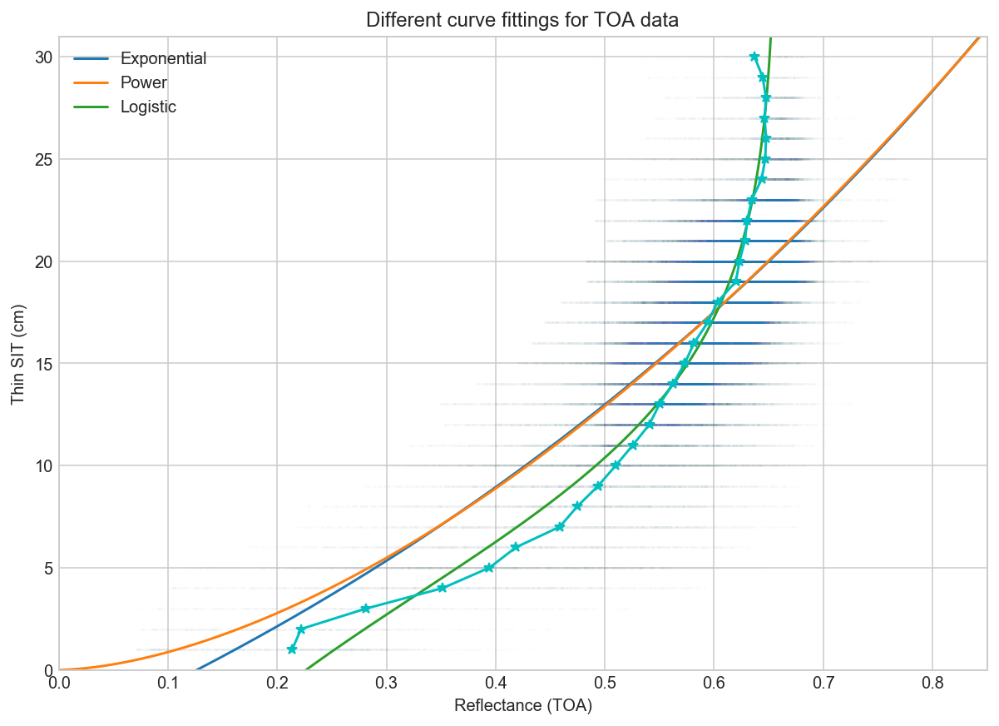

In [32]:
import scipy.optimize as optim

curveExp = optim.curve_fit(lambda t,a,b,c: a*np.exp(b*(t))+c,  x_arr,  y_arr)

curvePow = optim.curve_fit(lambda t, a, b: a*(t**b), x_arr, y_arr)

curveLog = optim.curve_fit(lambda t, L, k, x_0: x_0 - (np.log((L/t)-1)/k), mean_x, thin_ice_vals_iter)

Expfunc = lambda x, curve: curve[0][0]*np.exp(curve[0][1]*x) + curve[0][2]
Powfunc = lambda x, curve: curve[0][0]*(x**curve[0][1])
Logfunc = lambda x, curve: curve[0][2]-(np.log((curve[0][0]/x)-1)/curve[0][1])

test=np.arange(0, 1.0, 0.001)

plt.figure(figsize=(10, 7))
plt.plot(test, Expfunc(test, curveExp), label='Exponential')
plt.plot(test, Powfunc(test, curvePow), label='Power')
plt.plot(test, Logfunc(test, curveLog), label='Logistic')
plt.scatter(x_arr, y_arr, s=0.1, alpha=0.01)
plt.plot(mean_x, thin_ice_vals_iter, 'c-*')
plt.legend()
plt.title("Different curve fittings for TOA data")
plt.xlabel("Reflectance (TOA)")
plt.ylabel("Thin SIT (cm)")
plt.ylim([0, 31])
plt.xlim([0, 0.85])



In [33]:
curveExp

(array([ 20.78157051,   1.15530684, -24.05248144]),
 array([[ 5.73833555e-01, -2.00490088e-02, -6.46060045e-01],
        [-2.00490088e-02,  7.02901799e-04,  2.25149361e-02],
        [-6.46060045e-01,  2.25149361e-02,  7.28822602e-01]]))

# Multivariable regression using kernels

Finding a linear regression in a higher dimensional space using the kernel trick

In [12]:
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import IsolationForest
from sklearn.gaussian_process.kernels import WhiteKernel

### Find outliers for each band and remove them all

In [63]:
def reject_outliersSTD(data, m=2):
    outliers_idx = (abs(data - np.mean(data, axis=0)) < m * np.std(data, axis=0))
    return outliers_idx

mean_x=[]
std_x =[]
x_list=[]
y_list=[]
std_list=[]
x_list_ = []
idx_ro_list = []
for j, cmval in enumerate(thin_ice_vals_iter):
    thin_ice_cm = y_data == cmval
    y_cm = y_data[thin_ice_cm]
    x_data_cm = x_data[thin_ice_cm,...]
    idx_ro = reject_outliersSTD(x_data_cm, m=2)
    idx_opt = idx_ro[:,0] & idx_ro[:,1] & idx_ro[:,2] & idx_ro[:,3] & idx_ro[:,4] & idx_ro[:,5] & idx_ro[:,6] & idx_ro[:,7] & idx_ro[:,8]\
            & idx_ro[:,9] & idx_ro[:,10] & idx_ro[:,11]
    print(idx_opt.shape)
    x_list.append(x_data_cm[idx_opt,...])
    y_list.append(y_cm[idx_opt])
    idx_ro_list.append(idx_opt)
    

x_arr = np.concatenate(x_list)
y_arr = np.concatenate(y_list)
rand_idx = np.random.permutation(len(x_arr))
x_arr = x_arr[rand_idx]
y_arr = y_arr[rand_idx]


(1854,)
(817,)
(901,)
(2002,)
(2347,)
(2059,)
(2360,)
(2609,)
(2648,)
(3333,)
(4840,)
(7222,)
(9500,)
(10305,)
(10422,)
(12232,)
(12245,)
(12434,)
(17912,)
(15821,)
(13374,)
(11356,)
(6978,)
(2752,)
(2273,)
(1765,)
(1348,)
(1135,)
(439,)
(203,)


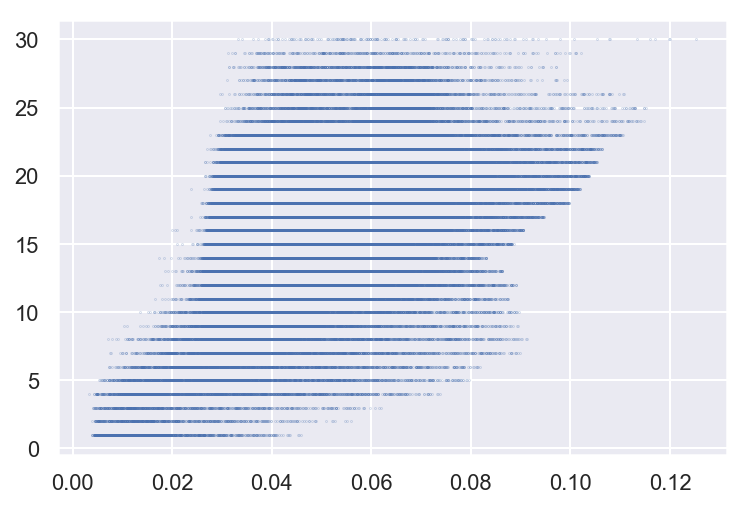

In [66]:
sns.set()
plt.figure()
plt.scatter(x_arr[:,10], y_arr, s=0.01)

In [ ]:
regressor = SVR(kernel='rbf',degree=6, verbose=True)

regressor.fit(x_arr, y_arr)

[LibSVM]

In [ ]:
pred = regressor.predict(x_arr)

In [ ]:
plt.figure()
plt.scatter(x_arr[:, 1], pred, s=0.001)
plt.scatter(x_arr[:, 1], y_arr, s=0.001)




In [39]:
with rasterio.open(r"E:\MastersProjectData\SIT_S2\20190315_103153_103453_slstr_tti-color_500\merged_S1C\merged.tif") as src:
    data=src.read()
    

data = data[:9,...].transpose(1,2,0)


data_flat = data.reshape(data.shape[0]*data.shape[1], -1)
data_flat_no = data_flat[(data_flat[...,0]!=0),...]
data_flat_no.shape

pred_data = regressor.predict(data_flat)

pred_img_flat = np.zeros((data.shape[0]*data.shape[1]), dtype='float32')
pred_img_flat[data_flat[..., 0]!=0] = pred_data

pred_img = pred_img_flat.reshape(data.shape[0], data.shape[1])
pred_img[masks[dates[-1]][0]==1] = 60

plt.figure(figsize=(10,10))
plt.imshow(pred_img[750:1900,1800:2400], cmap='jet', vmin=0, vmax=30)
plt.colorbar()
plt.show()

In [23]:
data_flat.shape

(2818182,)

# LightGBM implementation
## Light gradient boosting machine

In [9]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split


In [10]:
def rmsle(y_true, y_pred):
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean(np.power(np.log1p(y_true + 1) - np.log1p(y_pred + 1), 2)))

X_train, X_test, Y_train, Y_test = train_test_split(x_arr, y_arr, test_size=0.30)

params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmsle',
    'max_depth': 6, 
    'learning_rate': 0.1,
    'verbose': 0,}
n_estimators = 100

preds_buf = []
err_buf = []

n_iters=50
for i in range(n_iters):
    x_train, x_valid, y_train,  y_valid = train_test_split(X_train, Y_train, test_size=0.10, random_state=i)
    d_train = lgb.Dataset(x_train, label=y_train)
    d_valid = lgb.Dataset(x_valid, label=y_valid)
    watchlist = [d_valid]
    
    model = lgb.train(params, d_train, n_estimators, watchlist, verbose_eval=1)
    
    preds = model.predict(x_valid)
    print(preds)
    err = np.mean(np.abs(preds-y_valid))**2
    err_buf.append(err)
    print('RMSLE = ' + str(err))
    
    preds = model.predict(X_test)
    preds_buf.append(preds)
    

[17.67150284 24.08625722 19.27918153 ... 12.67290758 15.76631351
 15.48293613]
RMSLE = 5.311305287429723
[17.39637087 17.39909166 14.73526021 ... 18.69112405 17.3063813
 19.20776691]
RMSLE = 5.6437017967548275
[22.46350437 18.73153274 13.50582657 ... 18.74181193 17.76362095
 16.56836457]
RMSLE = 5.383171303348862
[18.23771397 18.18774107 14.17165333 ... 21.51096222 16.09789831
 18.40510899]
RMSLE = 5.608793578439197
[16.95304878 19.70163278 19.22386845 ... 12.37018344 10.80333428
 13.14236054]
RMSLE = 5.351318042641602


KeyboardInterrupt: 

In [165]:
predictions = model.predict(x_arr)

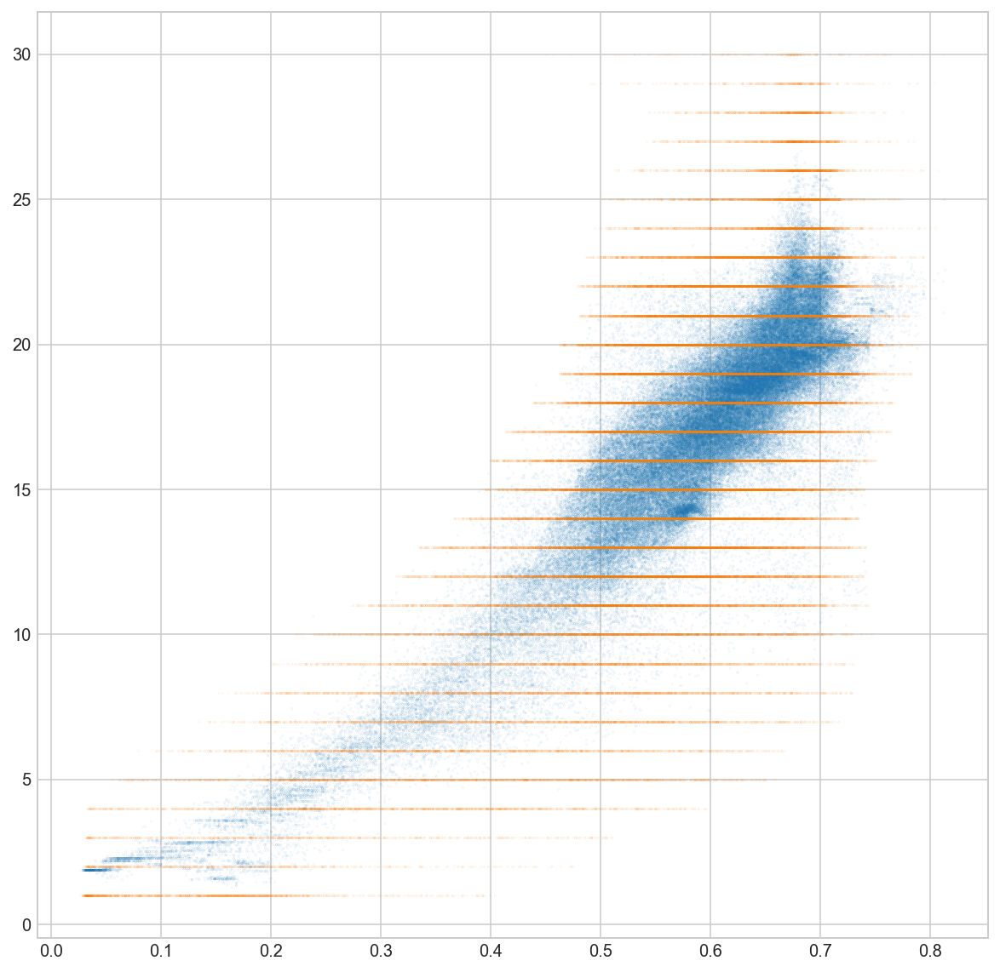

In [166]:
plt.figure(figsize=(10,10))
plt.scatter(x_arr[:, 8], predictions, s=0.001)
plt.scatter(x_arr[:, 8], y_arr, s=0.001)

### Plot image raster

(160484,)


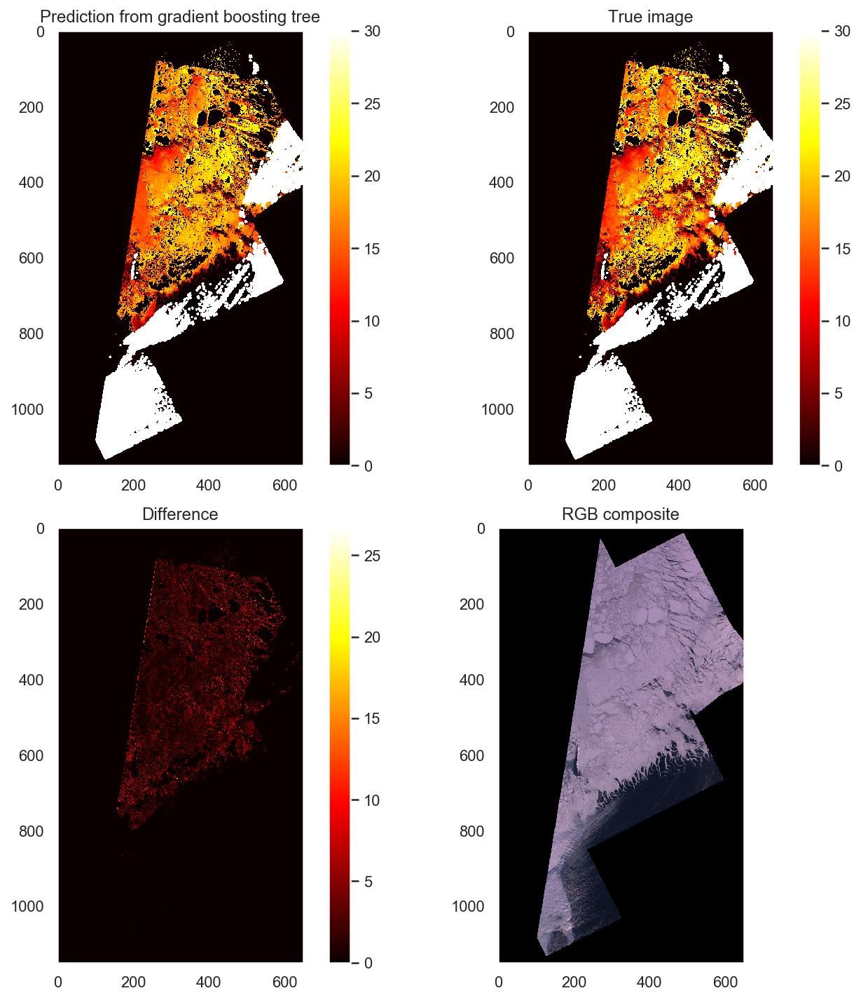

In [68]:
%matplotlib inline
sns.set_style('dark')
with rasterio.open(r"E:\MastersProjectData\SIT_S2\20190315_103153_103453_slstr_tti-color_500\merged_S1C\merged.tif") as src:
    data=src.read()
    
with rasterio.open(r"C:\Users\oyste\OneDrive\Shared\UiT skole\MastersFolder\Sentinel_2_ThinSeaIceThickness\sentinel4thinice_navgem_500\navgem\500\20190315_103153_103453_slstr_tti-color_500.tif") as sit:
    true = sit.read(1)
    
true_mask = (true > 100) & (true <= 130)
thick = true == 90
true[~true_mask] = 100
true[thick] = 140
true = true - 100
data = data[valid_bands,...].transpose(1,2,0)
rgb = data[..., [3, 2, 1]]
data[~true_mask] = 0.0

true[(data[..., 0]==0.0)] = 0
data_flat = data.reshape(data.shape[0]*data.shape[1], -1)

data_flat_no = data_flat[(data_flat[...,0]!=0),...]
data_flat_no.shape, data_flat.shape
pred_data = clfl.predict(data_flat_no)
print(pred_data.shape)
pred_img_flat = np.zeros((data.shape[0]*data.shape[1]), dtype='float32')
pred_img_flat[data_flat[..., 0]!=0] = pred_data

pred_img = pred_img_flat.reshape(data.shape[0], data.shape[1])
pred_img[masks[dates[-1]][0]==1] = 60
true[masks[dates[-1]][0]==1] = 60

diff = np.abs(true - pred_img)

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)
fig.subplots_adjust(bottom=0.15,wspace=0.05, hspace=0.1)
im1 = ax1.imshow(pred_img[750:1900,1800:2450], cmap='hot', vmin=0, vmax=30)
ax1.set_title("Prediction from gradient boosting tree")
fig.colorbar(im1, ax=ax1)
im2 = ax2.imshow(true[750:1900,1800:2450], cmap='hot', vmin=0, vmax=30)
ax2.set_title("True image")
fig.colorbar(im2, ax=ax2)
im3 = ax3.imshow(diff[750:1900,1800:2450], cmap='hot')
ax3.set_title("Difference")
fig.colorbar(im3, ax=ax3)
im4 = ax4.imshow(rgb[750:1900,1800:2450])
ax4.set_title("RGB composite")
fig.tight_layout()
plt.show()

### Plot 95th and 5th percentile and the predictions, using quantile regression

In [11]:
alpha=0.95
clfl = lgb.LGBMRegressor(objective='quantile',
                        alpha=alpha,
                        num_leaves = 128,
                        n_estimators = 100,
                        min_data_in_leaf = 5,
                        reg_sqrt=True,
                        max_depth=-1)
clfl.fit(x_arr, y_arr)
pred_upper = clfl.predict(x_arr)

clfl.set_params(alpha=1-alpha)
clfl.fit(x_arr, y_arr)
pred_lower = clfl.predict(x_arr)
losses = ['regression_l2', 'regression_l1', 'fair', 'poisson', 'mape', 'gamma','tweedie']
#for i, loss in enumerate(losses):
clfl.set_params(objective='fair')
clfl.fit(x_arr, y_arr)
pred = clfl.predict(x_arr)

#print("loss for ", loss ,": mean squared error: ", np.mean(np.abs(pred - y_arr))**2)

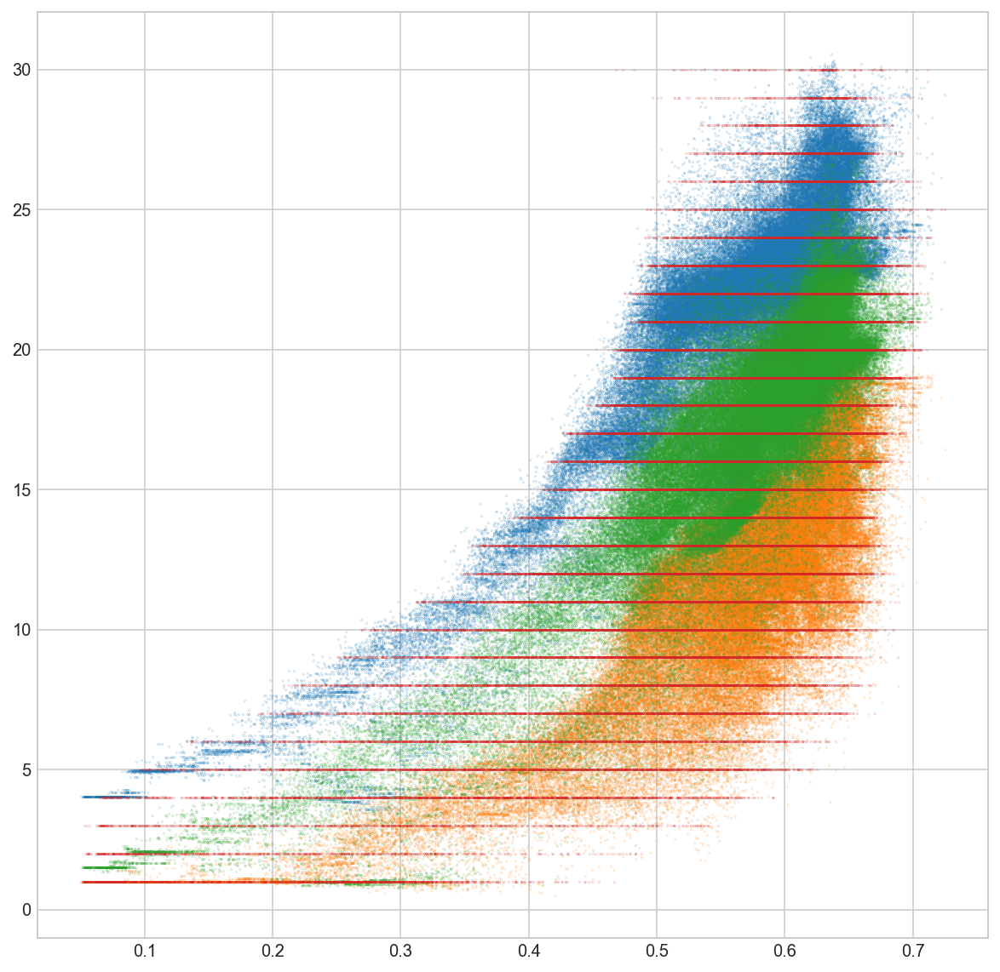

In [13]:
%matplotlib inline
plt.figure(figsize=(10,10))
plt.scatter(x_arr[:, 3], pred_upper, s=0.01)
plt.scatter(x_arr[:, 3], pred_lower, s=0.01)
plt.scatter(x_arr[:, 3], pred, s=0.01)
plt.scatter(x_arr[:, 3], y_arr, s=0.01)

In [39]:
import seaborn as sns
import pandas as pd
randidx = np.random.randint(0, len(x_arr), 1000)
arr_pred = np.concatenate([x_arr, (np.round(np.expand_dims(pred, axis=1)))], axis=1)
arr_true = np.concatenate([x_arr,np.expand_dims(y_arr, axis=1)], axis=1)
df_pred = pd.DataFrame(arr_pred[randidx])
df_true = pd.DataFrame(arr_true[randidx])



In [38]:
y_arr.shape, x_arr.shape

((164365,), (164365, 12))

In [40]:
df_pred[12]=pd.to_numeric(df_pred[12], downcast='integer')
df_true[12]=pd.to_numeric(df_true[12], downcast='integer')
df_pred[12], df_true[12]

(0      22
 1       9
 2      14
 3      20
 4      14
 5      20
 6      21
 7      14
 8       1
 9      20
 10     17
 11     15
 12     19
 13      6
 14     19
 15     22
 16     14
 17     22
 18     10
 19     18
 20     17
 21     19
 22     17
 23     17
 24     16
 25     11
 26     17
 27     19
 28     16
 29     18
        ..
 970     1
 971    21
 972    18
 973    16
 974    17
 975    18
 976    21
 977    23
 978    19
 979    20
 980    19
 981    17
 982    15
 983    20
 984     2
 985    16
 986    20
 987    20
 988    20
 989    19
 990    20
 991    14
 992     3
 993    16
 994    18
 995    20
 996    21
 997    20
 998    18
 999    17
 Name: 12, Length: 1000, dtype: int8, 0      27
 1       9
 2      14
 3      21
 4      15
 5      21
 6      19
 7      11
 8       1
 9      19
 10     16
 11     11
 12     20
 13      8
 14     19
 15     22
 16     18
 17     20
 18      7
 19     20
 20     16
 21     20
 22     21
 23     18
 24     18
 25     10
 26   

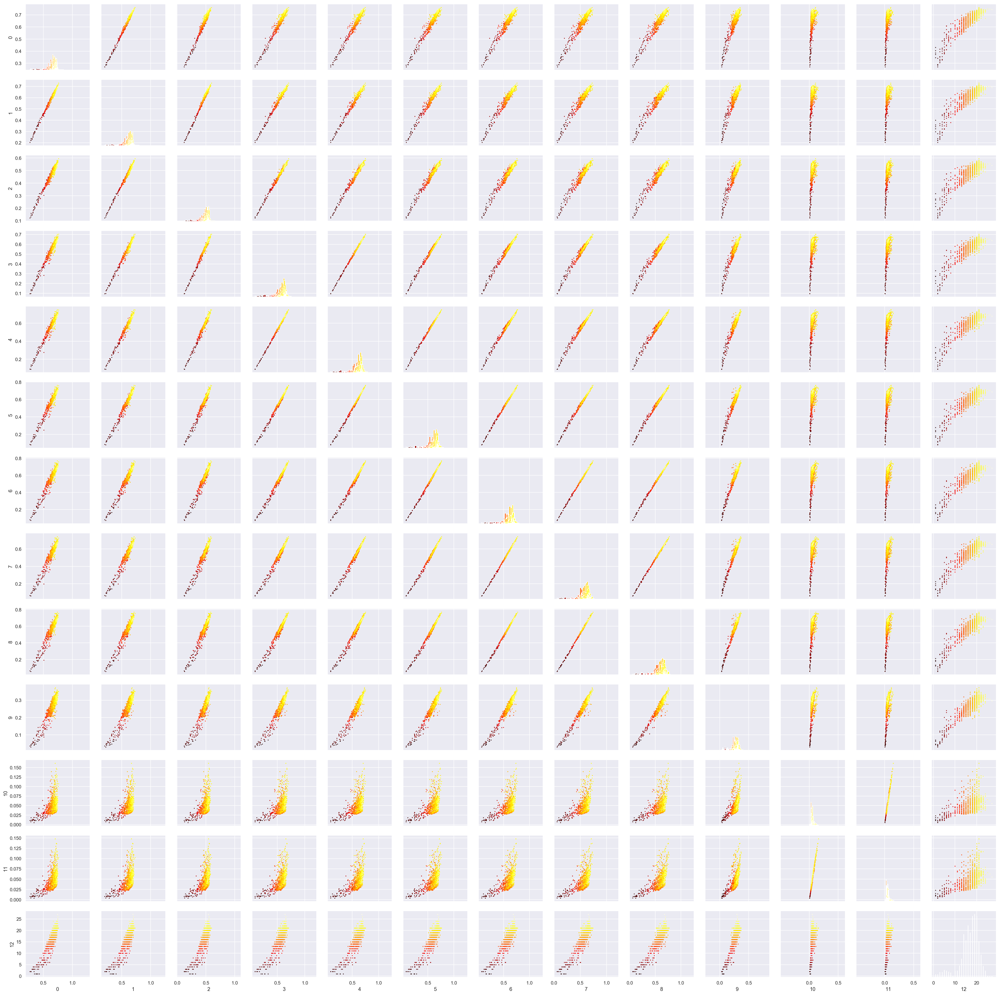

In [55]:
%matplotlib inline
sns.set_style('darkgrid')
g = sns.PairGrid(df_pred, hue=12, palette='hot')
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter, s=1)
g.savefig('Grid_pred.png')

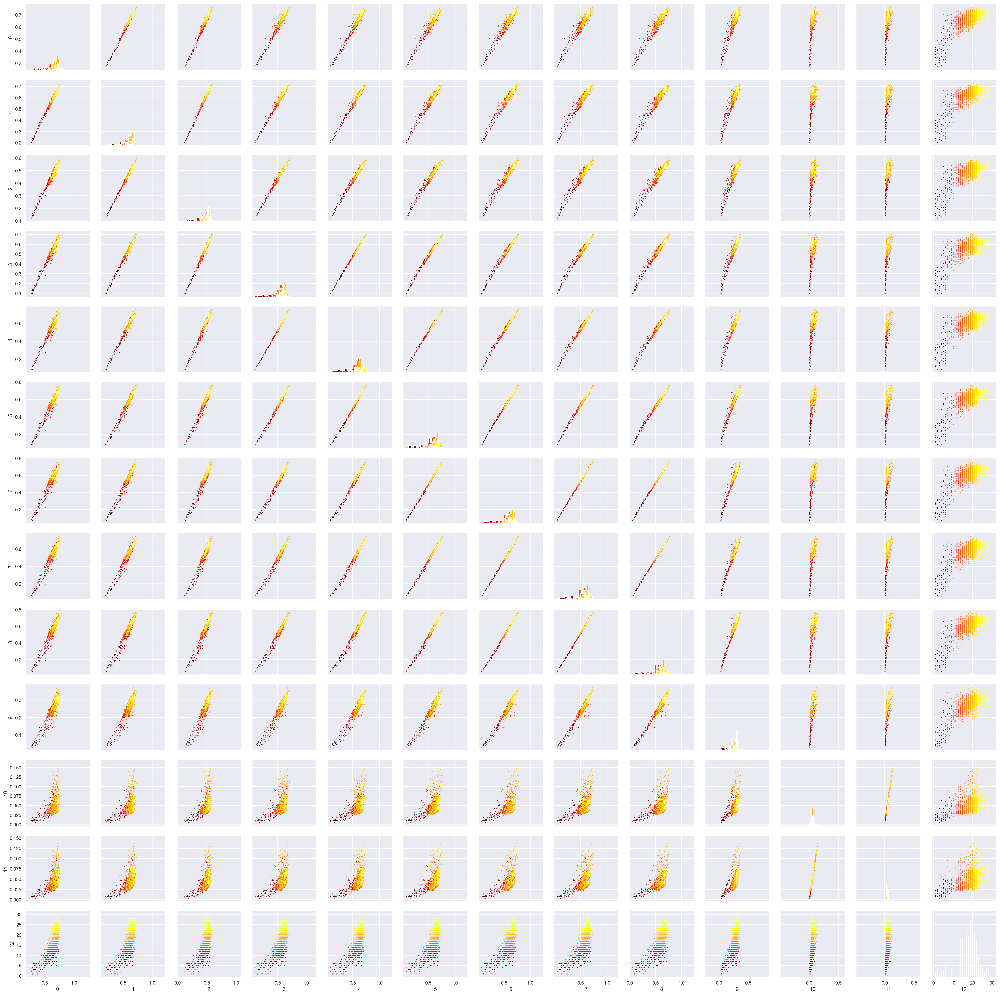

In [56]:
sns.set_style('darkgrid')
g = sns.PairGrid(df_true, hue=12, palette='hot')
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter, s=1)
g.savefig('Grid_true.png')